# ART 002 - Any Colour You Like

By **Daniel Palacio** (github.com/palaciodaniel) - October 2020

### 1. Getting required information

In order to plot all possible color variations, we need to know the available matplotlib's [colormaps](https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html). We can do that by simply running the following line:

In [1]:
import matplotlib.pyplot as plt
from skimage import color # We will use this library later, obviously.

plt.colormaps()[:5]

['Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG']

In order to save some space and keep everything tidy, notice we only printed the first five elements from the resulting list. However, it's important to know the total number of colormaps available:

In [2]:
print("Number of colormaps available:", len(plt.colormaps()))

Number of colormaps available: 164


And now we need to know the most appropriate number of columns to showcase all the image variations. We can determine this by dividing the length of the list by a couple of even numbers, but making sure that we get a remainder of 0.

In [3]:
possible_numbers = []

for i in range(2, 9): # Less than two is pointless, and more than eight is too much!
    if len(plt.colormaps()) % i == 0:
        possible_numbers.append(i)

print("Possible number of columns:", possible_numbers)

Possible number of columns: [2, 4]


We will choose four columns. We will assign it to the variable "cols". And now to determine the number of required rows, we simply take the length of the cmap list and divide it by the number of columns:

In [4]:
cols = 4
rows = int(len(plt.colormaps()) / cols)

print("Number of rows:", rows)
print("Number of columns:", cols)

Number of rows: 41
Number of columns: 4


With all this information, now we are ready to start plotting.

### 2. Loading the selected image

Consider that the resulting image will be particularly long, so we need to execute the following cell to force Jupyter Notebook to plot without scrollable frames. 

In [5]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

Now we can load our image and visualize it for reference. The [selected photo](https://unsplash.com/photos/QGiZcRap7e0) was taken from Unsplash.com, and its author is Serjan Midili.

![](unsplash.jpeg)

After downloading it, it was edited on Pinta (a Linux program to edit images) in a way that only the animal's head will be shown. The new file is called *hi_doggie.jpg*.

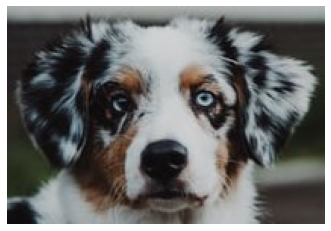

In [6]:
img = plt.imread("hi_doggie.jpg")
plt.axis("off")
plt.imshow(img)

### 3. Plotting

Just as a trivia, the name for this project is a Pink Floyd's song, in case you want to listen to it before you keep scrolling down...

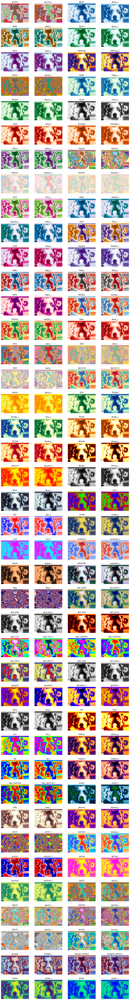

In [7]:
fig = plt.figure(figsize=(15, 120))
gray_img = color.rgb2gray(img) # We need a gray scaled image, otherwise the 'cmap' parameter will not work.

for i, cmap in enumerate(plt.colormaps()):
    fig.add_subplot(rows, cols, i + 1) # Last parameter is the position of the current image.
    plt.title(cmap)
    plt.axis("off")
    plt.imshow(gray_img, cmap = cmap)

### 3. Creating a function to load your own images

Most likely you will want to apply this process to your own images. If that is the case, then the following function will make things easier.

In [8]:
import matplotlib.pyplot as plt
from skimage import color

def cmapped_image(filename, cmap_cols = 4, fig_width = 15, fig_height = 120, cmap_names = True):
    """
    Loads an image, transforms it to grayscale 
    and prints one copy of it per colormap in matplotlib.
    """
    
    cmap_rows = int(len(plt.colormaps()) / cmap_cols)
        
    img = plt.imread(filename)
    gray_img = color.rgb2gray(img)
    
    fig = plt.figure(figsize=(fig_width, fig_height))
        
    for i, cmap in enumerate(plt.colormaps()):
        fig.add_subplot(cmap_rows, cmap_cols, i + 1)
        plt.axis("off")
        
        if cmap_names == True:
            plt.title(cmap)
            
        plt.imshow(gray_img, cmap = cmap)

Now you will be able to use your own images in a single line of code. As an example, this [image](https://unsplash.com/photos/lNNHyRbmm0o) was taken again from Unsplash.com, and its author is Jorik Kleen.

<img src="unsplash2.jpeg" width="300" height="300" />

Just like the previous image, the one that was used on the function was cropped to select only the girl's face. Also, although the image was resized to make it much smaller, it must be mentioned that the function was tried with the original size, and although it still displayed all the pictures correctly, it took almost almost two minutes to finish everything. Therefore it is strongly recommended that you use small images in order to increase speed, because the final result will not be affected at all.

The new file is called *blonde_girl.jpg*. Notice that this time we will not be showing the colormap's names above every picture.

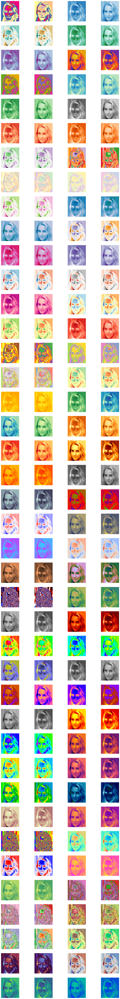

In [9]:
cmapped_image("blonde_girl.jpg", cmap_names = False)